## Shad Abdullah, Intern ID - i23b0034s05

# Import & Connection

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import psycopg2
import psycopg2.extras

%matplotlib inline

In [2]:
fact_table = pd.read_excel(r'e-com-sales-out.xlsx', sheet_name='Fact_table', engine='openpyxl')
item_dim = pd.read_excel(r'e-com-sales-out.xlsx', sheet_name='Item_dim', engine='openpyxl')
customer_dim = pd.read_excel(r'e-com-sales-out.xlsx', sheet_name='Customer_dim', engine='openpyxl')
time_dim = pd.read_excel(r'e-com-sales-out.xlsx', sheet_name='Time_dim', engine='openpyxl')
store_dim = pd.read_excel(r'e-com-sales-out.xlsx', sheet_name='Store_dim', engine='openpyxl')

In [3]:
class PostgresConnection(object):
    def __init__(self):
        self.connection = psycopg2.connect(database="ecomdb",
                                           user = "postgres",
                                           password = "1234",
                                           host = "127.0.0.1",
                                           port = "5432")

    def getConnection(self):
        print("Connection to DB established!")
        return self.connection

con = PostgresConnection().getConnection()

Connection to DB established!


# 1-5 OLAP Query

## Do some simple CUBE query including ROLL UP, DRILL DOWN, SLICE, DICE (Use at least two) to answer the following questions from the ecomdb warehouse

## Q1: Find the division/district/year/month wise total_sale_price joining fact table and respective dimension table

In [4]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select s.division, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.store_dim s on f.store_key = s.store_key
            group by cube(s.division)
            order by s.division
        """

cur.execute(div_q)
records = cur.fetchall()

Connection to DB established!


In [5]:
records

[('Barishal', Decimal('917117.25')),
 ('Chittagong', Decimal('719230.00')),
 ('Dhaka', Decimal('4640743.50')),
 ('Khulna', Decimal('1006215.50')),
 ('Mymensingh', Decimal('820235.00')),
 ('Rajshahi', Decimal('1137256.00')),
 ('Rangpur', Decimal('967796.75')),
 ('Sylhet', Decimal('1241738.75')),
 (None, Decimal('11450332.75'))]

In [6]:
div_df = pd.DataFrame(records, columns=["division","total sales"] )
div_df

,division,total sales
0,Barishal,917117.25
1,Chittagong,719230.00
2,Dhaka,4640743.50
3,Khulna,1006215.50
4,Mymensingh,820235.00
5,Rajshahi,1137256.00
6,Rangpur,967796.75
7,Sylhet,1241738.75
8,None,11450332.75


In [7]:
div_df = div_df.dropna()
div_df

,division,total sales
0,Barishal,917117.25
1,Chittagong,719230.00
2,Dhaka,4640743.50
3,Khulna,1006215.50
4,Mymensingh,820235.00
5,Rajshahi,1137256.00
6,Rangpur,967796.75
7,Sylhet,1241738.75


In [8]:
div_df["total sales"] = div_df["total sales"].astype("float64")

C:\Users\Saad\AppData\Local\Temp\ipykernel_9656\2671526810.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  div_df["total sales"] = div_df["total sales"].astype("float64")


In [9]:
div_df

,division,total sales
0,Barishal,917117.25
1,Chittagong,719230.00
2,Dhaka,4640743.50
3,Khulna,1006215.50
4,Mymensingh,820235.00
5,Rajshahi,1137256.00
6,Rangpur,967796.75
7,Sylhet,1241738.75


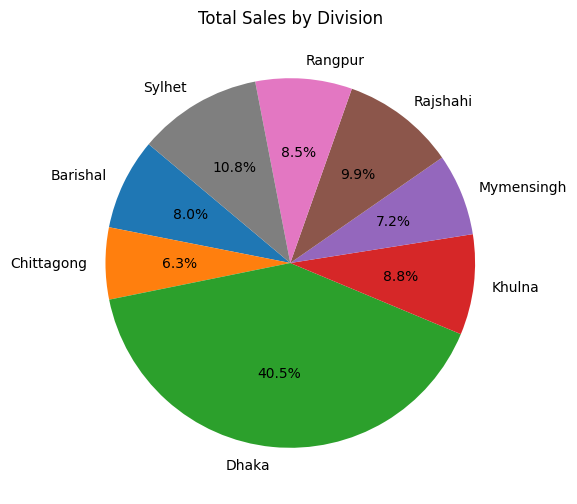

In [10]:
divisions = div_df['division'].tolist()
total_sales = div_df['total sales'].tolist()

plt.figure(figsize=(6, 6))
plt.pie(total_sales, labels=divisions, autopct='%1.1f%%', startangle=140)
plt.title('Total Sales by Division')
plt.show()

### RollUp

In [11]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select s.division, s.district, t.year, t.month, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.store_dim s on f.store_key = s.store_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            group by rollup(s.division, s.district, t.year, t.month)
            order by s.division
        """

cur.execute(div_q)
records = cur.fetchall()

Connection to DB established!


In [12]:
records

[('Barishal', 'Barishal', 2014, 2, Decimal('360.0')),
 ('Barishal', 'Barishal', 2014, 4, Decimal('502.0')),
 ('Barishal', 'Barishal', 2014, 5, Decimal('45.0')),
 ('Barishal', 'Barishal', 2014, 6, Decimal('224.0')),
 ('Barishal', 'Barishal', 2014, 7, Decimal('260.0')),
 ('Barishal', 'Barishal', 2014, 8, Decimal('282.0')),
 ('Barishal', 'Barishal', 2014, 9, Decimal('107.5')),
 ('Barishal', 'Barishal', 2014, 11, Decimal('580.0')),
 ('Barishal', 'Barishal', 2014, 12, Decimal('765.0')),
 ('Barishal', 'Barishal', 2014, None, Decimal('3125.5')),
 ('Barishal', 'Barishal', 2015, 1, Decimal('526.0')),
 ('Barishal', 'Barishal', 2015, 2, Decimal('352.0')),
 ('Barishal', 'Barishal', 2015, 3, Decimal('7205.0')),
 ('Barishal', 'Barishal', 2015, 4, Decimal('632.0')),
 ('Barishal', 'Barishal', 2015, 5, Decimal('732.5')),
 ('Barishal', 'Barishal', 2015, 6, Decimal('2484.5')),
 ('Barishal', 'Barishal', 2015, 7, Decimal('6282.0')),
 ('Barishal', 'Barishal', 2015, 8, Decimal('312.0')),
 ('Barishal', 'Baris

In [13]:
div_df1 = pd.DataFrame(records, columns=["division","district","year","month","total sales"] )
div_df1

,division,district,year,month,total sales
0,Barishal,Barishal,2014.0,2.0,360.0
1,Barishal,Barishal,2014.0,4.0,502.0
2,Barishal,Barishal,2014.0,5.0,45.0
3,Barishal,Barishal,2014.0,6.0,224.0
4,Barishal,Barishal,2014.0,7.0,260.0
...,...,...,...,...,...
2791,Sylhet,Sylhet,2022.0,10.0,1138.0
2792,Sylhet,Sylhet,2022.0,NaN,31881.5
2793,Sylhet,Sylhet,NaN,NaN,615595.00
2794,Sylhet,None,NaN,NaN,1241738.75


In [14]:
div_df1 = div_df1.drop(2795)
div_df1

,division,district,year,month,total sales
0,Barishal,Barishal,2014.0,2.0,360.0
1,Barishal,Barishal,2014.0,4.0,502.0
2,Barishal,Barishal,2014.0,5.0,45.0
3,Barishal,Barishal,2014.0,6.0,224.0
4,Barishal,Barishal,2014.0,7.0,260.0
...,...,...,...,...,...
2790,Sylhet,Sylhet,2022.0,9.0,921.0
2791,Sylhet,Sylhet,2022.0,10.0,1138.0
2792,Sylhet,Sylhet,2022.0,NaN,31881.5
2793,Sylhet,Sylhet,NaN,NaN,615595.00


In [15]:
div_df1["total sales"] = div_df1["total sales"].astype("float64")

In [16]:
div_df1

,division,district,year,month,total sales
0,Barishal,Barishal,2014.0,2.0,360.00
1,Barishal,Barishal,2014.0,4.0,502.00
2,Barishal,Barishal,2014.0,5.0,45.00
3,Barishal,Barishal,2014.0,6.0,224.00
4,Barishal,Barishal,2014.0,7.0,260.00
...,...,...,...,...,...
2790,Sylhet,Sylhet,2022.0,9.0,921.00
2791,Sylhet,Sylhet,2022.0,10.0,1138.00
2792,Sylhet,Sylhet,2022.0,NaN,31881.50
2793,Sylhet,Sylhet,NaN,NaN,615595.00


In [17]:
div_df1.isna().sum()

division         0
district         8
year            34
month          268
total sales      0
dtype: int64

In [18]:
div_df2 = div_df1.dropna()
div_df2

,division,district,year,month,total sales
0,Barishal,Barishal,2014.0,2.0,360.0
1,Barishal,Barishal,2014.0,4.0,502.0
2,Barishal,Barishal,2014.0,5.0,45.0
3,Barishal,Barishal,2014.0,6.0,224.0
4,Barishal,Barishal,2014.0,7.0,260.0
...,...,...,...,...,...
2787,Sylhet,Sylhet,2022.0,6.0,90.0
2788,Sylhet,Sylhet,2022.0,7.0,84.0
2789,Sylhet,Sylhet,2022.0,8.0,4764.0
2790,Sylhet,Sylhet,2022.0,9.0,921.0


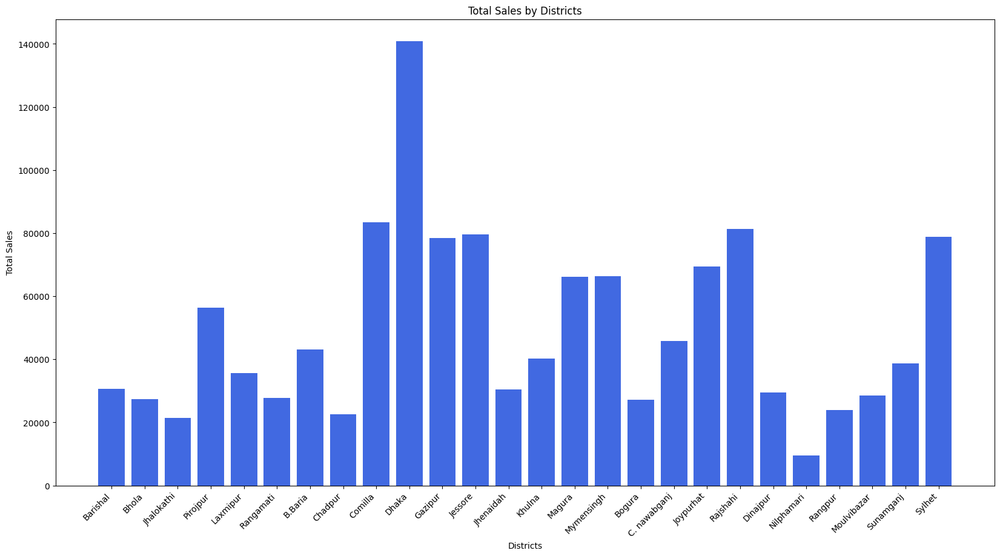

In [19]:
districts = div_df2['district']
total_sales = div_df2['total sales']

plt.figure(figsize=(20, 10))
plt.bar(districts, total_sales, color='royalblue')
plt.xlabel('Districts')
plt.ylabel('Total Sales')
plt.title('Total Sales by Districts')

plt.xticks(rotation=45, ha='right')
plt.show()

## Q2: Find the customer/bank/transaction(cash/online) wise total_sale_price joining fact table and respective dimension table

In [20]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select c.name, t.bank_name, t.trans_type, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.customer_dim c on f.coustomer_key = c.coustomer_key
            join ecomdb_star_schema.trans_dim t on f.payment_key = t.payment_key
            group by cube(c.name, t.bank_name, t.trans_type)
            order by c.name
        """

cur.execute(div_q)
records = cur.fetchall()

Connection to DB established!


In [21]:
records

[('aaftaab husan', 'Shimanto Bank Ltd', None, Decimal('448.0')),
 ('aaftaab husan', 'United Commercial Bank Ltd', None, Decimal('210.0')),
 ('aaftaab husan', None, None, Decimal('18565.0')),
 ('aaftaab husan', 'AB Bank Limited', 'card', Decimal('60.0')),
 ('aaftaab husan', 'Citizens Bank Limited', None, Decimal('663.0')),
 ('aaftaab husan', 'Bank Asia Limited', None, Decimal('5328.0')),
 ('aaftaab husan', None, 'card', Decimal('18565.0')),
 ('aaftaab husan', 'Pubali Bank Limited', None, Decimal('7188.0')),
 ('aaftaab husan', 'Citizens Bank Limited', 'card', Decimal('663.0')),
 ('aaftaab husan', 'IFIC Bank Limited', None, Decimal('4260.0')),
 ('aaftaab husan', 'Mutual Trust Bank Limited', 'card', Decimal('264.0')),
 ('aaftaab husan', 'Mutual Trust Bank Limited', None, Decimal('264.0')),
 ('aaftaab husan', 'Pubali Bank Limited', 'card', Decimal('7188.0')),
 ('aaftaab husan', 'IFIC Bank Limited', 'card', Decimal('4260.0')),
 ('aaftaab husan', 'AB Bank Limited', None, Decimal('60.0')),
 ('

In [22]:
df_q2 = pd.DataFrame(records, columns = ["customer name","bank name","trans type","total sales"])
df_q2

,customer name,bank name,trans type,total sales
0,aaftaab husan,Shimanto Bank Ltd,None,448.0
1,aaftaab husan,United Commercial Bank Ltd,None,210.0
2,aaftaab husan,None,None,18565.0
3,aaftaab husan,AB Bank Limited,card,60.0
4,aaftaab husan,Citizens Bank Limited,None,663.0
...,...,...,...,...
20198,None,South Bangla Agriculture and Commerce Bank Lim...,None,363960.00
20199,None,Bengal Commercial Bank Ltd,None,280718.50
20200,None,IFIC Bank Limited,None,263746.25
20201,None,Standard Bank Limited,None,464485.75


In [23]:
df_q2["total sales"] = df_q2["total sales"].astype("float64")
df_q2

,customer name,bank name,trans type,total sales
0,aaftaab husan,Shimanto Bank Ltd,None,448.00
1,aaftaab husan,United Commercial Bank Ltd,None,210.00
2,aaftaab husan,None,None,18565.00
3,aaftaab husan,AB Bank Limited,card,60.00
4,aaftaab husan,Citizens Bank Limited,None,663.00
...,...,...,...,...
20198,None,South Bangla Agriculture and Commerce Bank Lim...,None,363960.00
20199,None,Bengal Commercial Bank Ltd,None,280718.50
20200,None,IFIC Bank Limited,None,263746.25
20201,None,Standard Bank Limited,None,464485.75


In [24]:
df_q2.isna().sum()

customer name      82
bank name        3397
trans type       9747
total sales         0
dtype: int64

In [25]:
df_q2 = df_q2.dropna()
df_q2.isna().sum()

customer name    0
bank name        0
trans type       0
total sales      0
dtype: int64

In [26]:
df_q2

,customer name,bank name,trans type,total sales
3,aaftaab husan,AB Bank Limited,card,60.0
8,aaftaab husan,Citizens Bank Limited,card,663.0
10,aaftaab husan,Mutual Trust Bank Limited,card,264.0
12,aaftaab husan,Pubali Bank Limited,card,7188.0
13,aaftaab husan,IFIC Bank Limited,card,4260.0
...,...,...,...,...
20106,zareena,Bkash,mobile,562.5
20116,ziyabul,Shimanto Bank Ltd,card,288.0
20117,ziyabul,NaN,cash,273.0
20119,ziyabul,Eastern Bank Limited,card,187.0


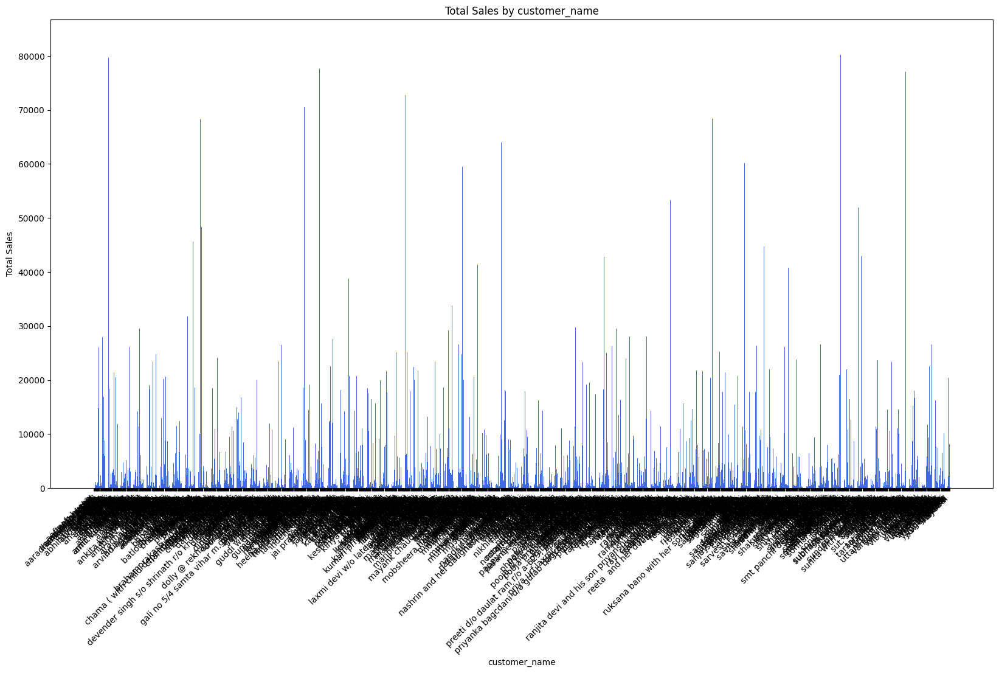

In [27]:
customer_name = df_q2['customer name']
total_sales = df_q2['total sales']

plt.figure(figsize=(20, 10))
plt.bar(customer_name, total_sales, color='royalblue')
plt.xlabel('customer_name')
plt.ylabel('Total Sales')
plt.title('Total Sales by customer_name')

plt.xticks(rotation=45, ha='right')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

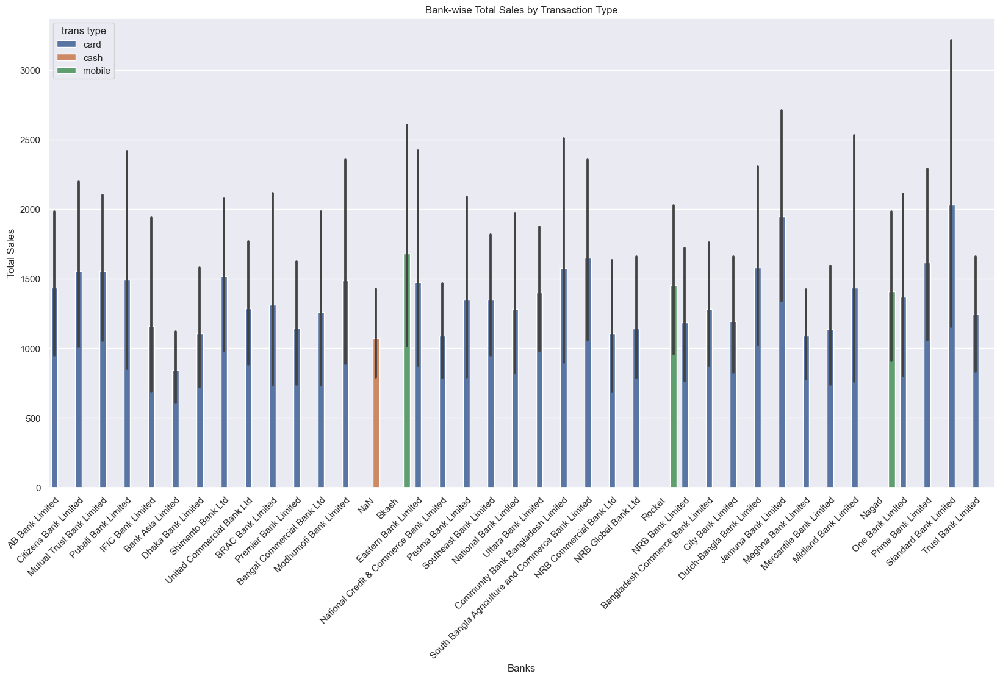

In [29]:
bank_name = df_q2['bank name']
total_sales = df_q2['total sales']
trans_type = df_q2['trans type']

plt.figure(figsize=(20, 10))
sns.barplot(x=bank_name, y=total_sales, hue=trans_type)
plt.xlabel('Banks')
plt.ylabel('Total Sales')
plt.title('Bank-wise Total Sales by Transaction Type')

plt.xticks(rotation=45, ha='right')
plt.show()

## Q3: Total sales in Barishal compared with other divisions total sales

In [30]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ SELECT s.division, SUM(f.total_price) FROM ecomdb_star_schema.fact_table f 
            join ecomdb_star_schema.store_dim s on s.store_key = f.store_key
            group by cube(s.division)
            order by s.division;
        """
cur.execute(div_q)
b_records = cur.fetchall()

Connection to DB established!


In [31]:
b_records

[('Barishal', Decimal('917117.25')),
 ('Chittagong', Decimal('719230.00')),
 ('Dhaka', Decimal('4640743.50')),
 ('Khulna', Decimal('1006215.50')),
 ('Mymensingh', Decimal('820235.00')),
 ('Rajshahi', Decimal('1137256.00')),
 ('Rangpur', Decimal('967796.75')),
 ('Sylhet', Decimal('1241738.75')),
 (None, Decimal('11450332.75'))]

In [32]:
df_b = pd.DataFrame(b_records, columns = ["division","total_price"])
df_b = df_b.dropna()
df_b

,division,total_price
0,Barishal,917117.25
1,Chittagong,719230.00
2,Dhaka,4640743.50
3,Khulna,1006215.50
4,Mymensingh,820235.00
5,Rajshahi,1137256.00
6,Rangpur,967796.75
7,Sylhet,1241738.75


In [33]:
df_b['total_price'] = df_b['total_price'].astype('float64')
df_b

,division,total_price
0,Barishal,917117.25
1,Chittagong,719230.00
2,Dhaka,4640743.50
3,Khulna,1006215.50
4,Mymensingh,820235.00
5,Rajshahi,1137256.00
6,Rangpur,967796.75
7,Sylhet,1241738.75


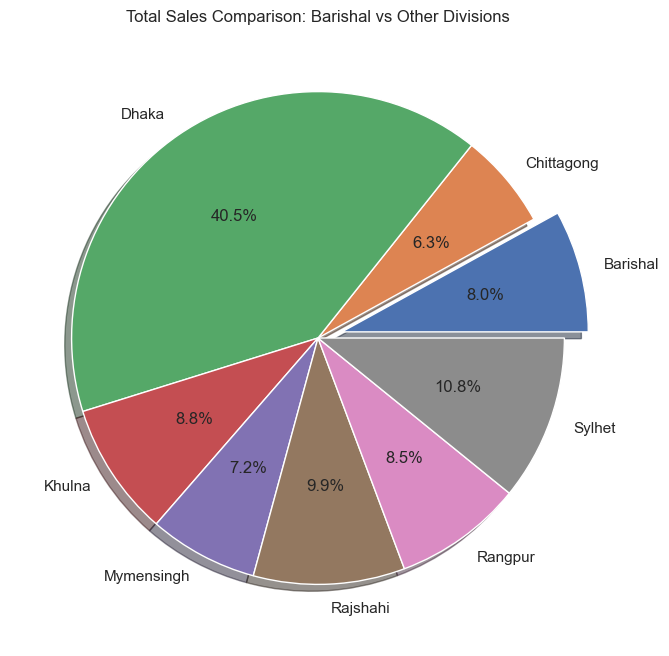

In [34]:
plt.figure(figsize=(8, 8))

explode = [0.1 if division == 'Barishal' else 0 for division in df_b['division']]
plt.pie(df_b['total_price'], labels=df_b['division'], autopct='%1.1f%%', explode=explode, shadow=True)
plt.title('Total Sales Comparison: Barishal vs Other Divisions')
plt.show()

## Q4: Total sales in 2015

In [35]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ SELECT t.year, t.quarter, SUM(f.total_price) FROM ecomdb_star_schema.fact_table f 
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            where t.year = 2015
            group by cube(t.year, t.quarter)
            order by t.quarter;
        """
cur.execute(div_q)
records = cur.fetchall()

Connection to DB established!


In [36]:
records

[(2015, 'Q1', Decimal('383978.00')),
 (None, 'Q1', Decimal('383978.00')),
 (None, 'Q2', Decimal('204132.00')),
 (2015, 'Q2', Decimal('204132.00')),
 (None, 'Q3', Decimal('282899.25')),
 (2015, 'Q3', Decimal('282899.25')),
 (2015, 'Q4', Decimal('364751.25')),
 (None, 'Q4', Decimal('364751.25')),
 (2015, None, Decimal('1235760.50')),
 (None, None, Decimal('1235760.50'))]

In [37]:
df_4 = pd.DataFrame(records, columns = ["year","quarter","total sales"])
df_4

,year,quarter,total sales
0,2015.0,Q1,383978.00
1,NaN,Q1,383978.00
2,NaN,Q2,204132.00
3,2015.0,Q2,204132.00
4,NaN,Q3,282899.25
5,2015.0,Q3,282899.25
6,2015.0,Q4,364751.25
7,NaN,Q4,364751.25
8,2015.0,None,1235760.50
9,NaN,None,1235760.50


In [38]:
df_4 = df_4.dropna()
df_4

,year,quarter,total sales
0,2015.0,Q1,383978.00
3,2015.0,Q2,204132.00
5,2015.0,Q3,282899.25
6,2015.0,Q4,364751.25


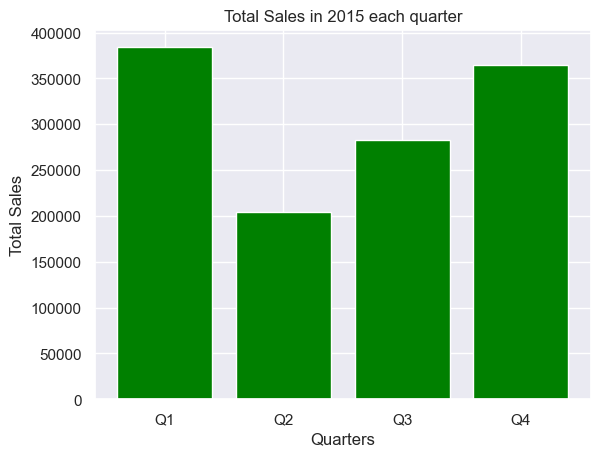

In [39]:
quarters = df_4['quarter']
total_sales = df_4['total sales']

plt.bar(quarters, total_sales, color='green')
plt.xlabel('Quarters')
plt.ylabel('Total Sales')
plt.title('Total Sales in 2015 each quarter')
plt.show()

## Q5: Total sales of Dhaka in 2015

In [40]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ SELECT s.division, t.quarter, SUM(f.total_price) FROM ecomdb_star_schema.fact_table f 
            join ecomdb_star_schema.store_dim s on s.store_key = f.store_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            where t.year = 2015 AND s.division = 'Dhaka'
            group by cube(s.division, t.quarter)
            order by t.quarter;
        """
cur.execute(div_q)
records = cur.fetchall()

Connection to DB established!


In [41]:
records

[('Dhaka', 'Q1', Decimal('200609.25')),
 (None, 'Q1', Decimal('200609.25')),
 (None, 'Q2', Decimal('94898.25')),
 ('Dhaka', 'Q2', Decimal('94898.25')),
 ('Dhaka', 'Q3', Decimal('106701.00')),
 (None, 'Q3', Decimal('106701.00')),
 ('Dhaka', 'Q4', Decimal('130920.25')),
 (None, 'Q4', Decimal('130920.25')),
 ('Dhaka', None, Decimal('533128.75')),
 (None, None, Decimal('533128.75'))]

In [42]:
df_5 = pd.DataFrame(records, columns = ["division","quarter","total sales"])
df_5

,division,quarter,total sales
0,Dhaka,Q1,200609.25
1,None,Q1,200609.25
2,None,Q2,94898.25
3,Dhaka,Q2,94898.25
4,Dhaka,Q3,106701.00
5,None,Q3,106701.00
6,Dhaka,Q4,130920.25
7,None,Q4,130920.25
8,Dhaka,None,533128.75
9,None,None,533128.75


In [43]:
df_5 = df_5.dropna()
df_5

,division,quarter,total sales
0,Dhaka,Q1,200609.25
3,Dhaka,Q2,94898.25
4,Dhaka,Q3,106701.00
6,Dhaka,Q4,130920.25


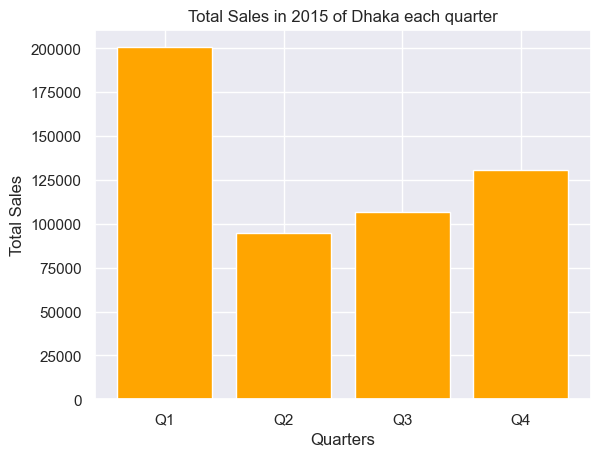

In [44]:
quarters = df_5['quarter']
total_sales = df_5['total sales']

plt.bar(quarters, total_sales, color='orange')
plt.xlabel('Quarters')
plt.ylabel('Total Sales')
plt.title('Total Sales in 2015 of Dhaka each quarter')
plt.show()

# 6-10 OLAP Query

## Q6: For each store(item supplier), what are the top three products offered that are most often purchased? 
    S1-> item1 -> quantity_sales

    S1-> item2 -> quantity_sales

    S1-> item3 -> quantity_sales

In [45]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ SELECT s.store_key, i.item_name, sum(f.quantity) FROM ecomdb_star_schema.fact_table f 
            join ecomdb_star_schema.store_dim s on s.store_key = f.store_key
            join ecomdb_star_schema.item_dim i on i.item_key = f.item_key
            group by cube(s.store_key, i.item_name)
            order by s.store_key, sum(f.quantity) desc;
        """
cur.execute(div_q)
records = cur.fetchall()

Connection to DB established!


In [46]:
records

[('S0001', None, Decimal('10228')),
 ('S0001', 'Sweet N Low Sweetener', Decimal('1410')),
 ('S0001', 'Foam Coffee Cups - 16 ounce', Decimal('893')),
 ('S0001', 'Hefty Supreme Foam Plates 9 inch', Decimal('641')),
 ('S0001', 'Truvia Natural Sweetener', Decimal('515')),
 ('S0001', 'Foam Coffee Cups - 12 ounce', Decimal('510')),
 ('S0001', 'Paper Plates 7 inch  Ultra Strong', Decimal('438')),
 ('S0001', 'Hefty Supreme Foam Bowls 12oz', Decimal('385')),
 ('S0001', 'Sugar in the Raw Packets', Decimal('323')),
 ('S0001', 'Double Bubble Variety Tub', Decimal('274')),
 ('S0001', 'K Cups Daily Chef Columbian Supremo', Decimal('238')),
 ('S0001', 'Red Plastic Cups 18oz', Decimal('231')),
 ('S0001', 'Mars Mini Mix', Decimal('187')),
 ('S0001', 'All Purpose Cleaner 409 Spray', Decimal('169')),
 ('S0001', 'Cascade Gel Packs Dishwasher', Decimal('166')),
 ('S0001', 'Paper Plates 8.5 inch Ultra Strong', Decimal('159')),
 ('S0001', 'Dark Chocolate Mint Patties', Decimal('149')),
 ('S0001', 'K Cups Fol

In [47]:
df_6 = pd.DataFrame(records, columns = ["store_key","item_name","total sales(quantity)"])
df_6

,store_key,item_name,total sales(quantity)
0,S0001,None,10228
1,S0001,Sweet N Low Sweetener,1410
2,S0001,Foam Coffee Cups - 16 ounce,893
3,S0001,Hefty Supreme Foam Plates 9 inch,641
4,S0001,Truvia Natural Sweetener,515
...,...,...,...
6954,None,Clorox Disinfecting Wipes,94
6955,None,Lysol Wipes 100 ct,82
6956,None,Dial Anti-bacterial Foam 7.5oz,73
6957,None,Lysol Disinfectant Spray 19 oz,72


In [48]:
df_6 = df_6.dropna()
df_6

,store_key,item_name,total sales(quantity)
1,S0001,Sweet N Low Sweetener,1410
2,S0001,Foam Coffee Cups - 16 ounce,893
3,S0001,Hefty Supreme Foam Plates 9 inch,641
4,S0001,Truvia Natural Sweetener,515
5,S0001,Foam Coffee Cups - 12 ounce,510
...,...,...,...
6694,S0044,Coffee-Mate Original Flavor Cold,1
6695,S0044,Waterloo Sparkling Watermelon 12oz,1
6696,S0044,Sobe Zero Lifewater Variety 20 oz,1
6697,S0044,Waterloo Sparkling Lemon 12oz,1


In [49]:
df_6_1 = df_6.groupby("store_key").head(3)
df_6_1

,store_key,item_name,total sales(quantity)
1,S0001,Sweet N Low Sweetener,1410
2,S0001,Foam Coffee Cups - 16 ounce,893
3,S0001,Hefty Supreme Foam Plates 9 inch,641
150,S0002,Stirrers Coffee Stirs 7inch,4024
151,S0002,Napkins Square Lunch,1891
...,...,...,...
6400,S0043,Sweet N Low Sweetener,1978
6401,S0043,Equal Sweetener,1131
6550,S0044,Splenda Sweetener,1103
6551,S0044,Njoy Creamer Packs,708


C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

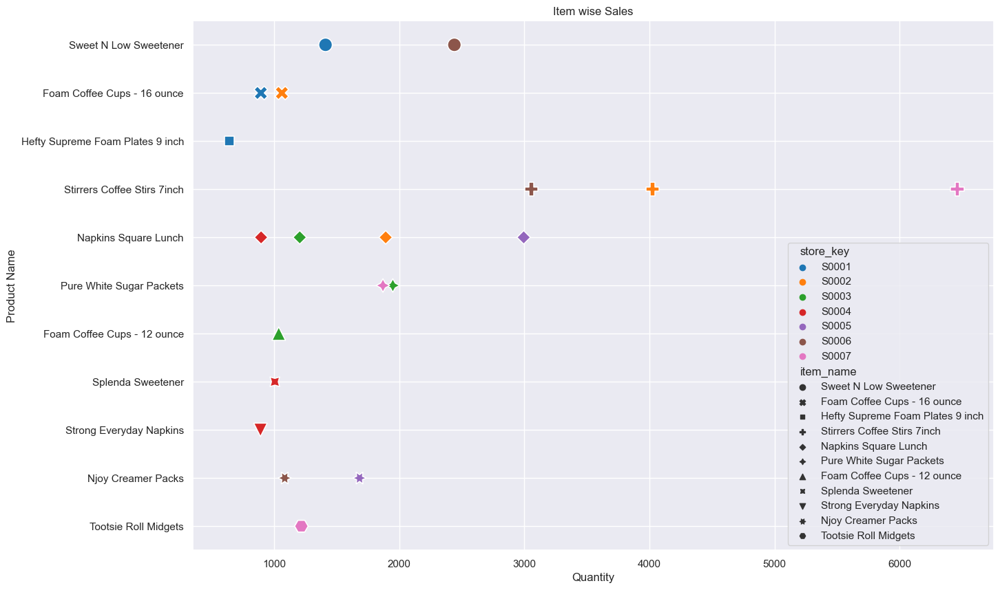

In [50]:
df = df_6_1[0:21]
plt.figure(figsize = (15,10))
plt.title("Item wise Sales")
plt.xlabel("Quantity")
plt.ylabel("Product Name")
sns.scatterplot(data=df,x="total sales(quantity)",y="item_name",hue="store_key",palette="tab10",s=200,style="item_name")
sns.set(font_scale = 1)

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

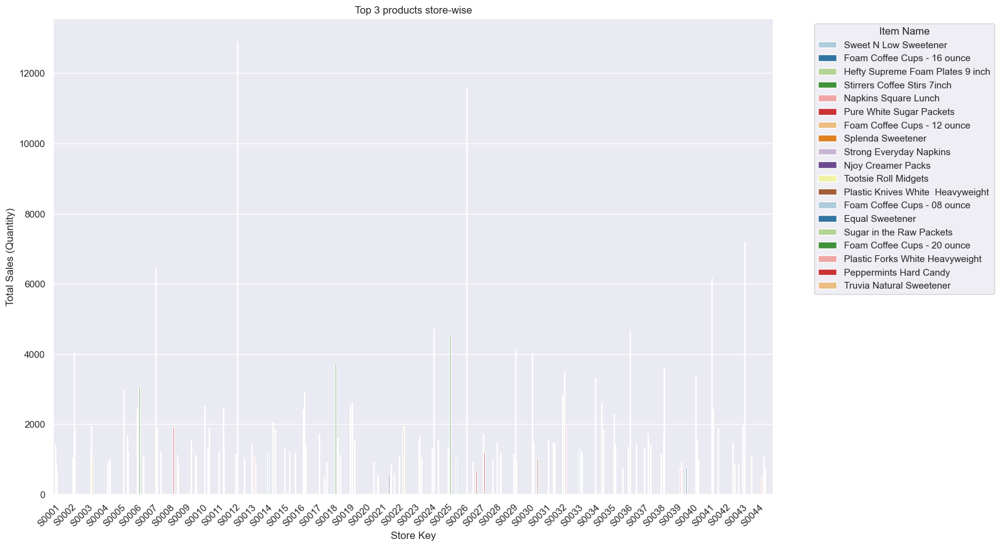

In [51]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.barplot(x='store_key', y='total sales(quantity)', hue='item_name', data=df_6_1, palette='Paired', ax=ax)
plt.xticks(rotation=45, ha='right')

plt.title("Top 3 products store-wise")
plt.xlabel("Store Key")
plt.ylabel("Total Sales (Quantity)")
plt.legend(title='Item Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Q7: What products have been sold through card or mobile since X days?

    input: X = 400 days [use 400 or more days]

    output: [item1, item2, item3, ...........]

## Q8: What season(quarter) is the worst for each product item? As example,

       item1-> q1

       item2-> q2

In [52]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ SELECT i.item_name, t.quarter, sum(f.total_price) FROM ecomdb_star_schema.fact_table f 
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            join ecomdb_star_schema.item_dim i on i.item_key = f.item_key
            group by cube(i.item_name, t.quarter)
            order by i.item_name, sum(f.quantity);
        """
cur.execute(div_q)
records = cur.fetchall()
df_8 = pd.DataFrame(records, columns = ["item_name","quarter","total_price"])
df_8 = df_8.dropna()
df_8

Connection to DB established!


,item_name,quarter,total_price
0,100% Juice Box Variety 6.75 oz,Q4,660.0
1,100% Juice Box Variety 6.75 oz,Q2,1635.0
2,100% Juice Box Variety 6.75 oz,Q3,2130.0
3,100% Juice Box Variety 6.75 oz,Q1,2865.0
5,A&W Root Beer - 12 oz cans,Q3,931.5
...,...,...,...
1288,Yoplait Original Yogurt Variety Pack,Q4,1404.0
1290,Zoo Animal Cookies/Crackers,Q1,2016.0
1291,Zoo Animal Cookies/Crackers,Q2,2310.0
1292,Zoo Animal Cookies/Crackers,Q3,3724.0


In [53]:
df_8 = df_8.groupby("item_name").head(1)
df_8

,item_name,quarter,total_price
0,100% Juice Box Variety 6.75 oz,Q4,660.0
5,A&W Root Beer - 12 oz cans,Q3,931.5
10,A&W Root Beer Diet - 12 oz cans,Q1,202.50
15,Advil 2 pill packets,Q1,2310.0
20,All Purpose Cleaner 409 Spray,Q3,8028.0
...,...,...,...
1270,Welch's 100% Juice Variety10 oz,Q4,1241.0
1275,Wint O Green LifeSavers Sugar Free,Q2,3088.0
1280,Wonderful Pistachios (in shell),Q3,946.0
1285,Yoplait Original Yogurt Variety Pack,Q1,576.0


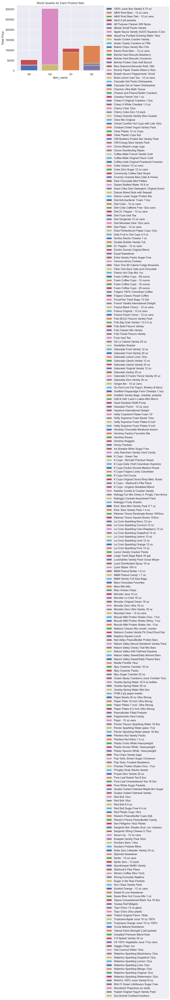

In [54]:
for item_name, data in df_8.groupby('item_name'):
    plt.bar(data['quarter'], data['total_price'], label=item_name)

plt.xlabel('item_name')
plt.ylabel('Total Price')
plt.title('Worst Quarter for Each Product Item')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

## Q9: Break down the total sales of items geographically (division-wise).

     item1-> division1->total_sales

     item1-> division2->total_sales

In [55]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ SELECT i.item_name, s.division, sum(f.total_price) FROM ecomdb_star_schema.fact_table f 
            join ecomdb_star_schema.store_dim s on s.store_key = f.store_key
            join ecomdb_star_schema.item_dim i on i.item_key = f.item_key
            group by cube(i.item_name, s.division)
            order by i.item_name, s.division;
        """
cur.execute(div_q)
records = cur.fetchall()
df_9 = pd.DataFrame(records, columns = ["item_name","division","total_price"])
df_9 = df_9.dropna()
df_9

Connection to DB established!


,item_name,division,total_price
0,100% Juice Box Variety 6.75 oz,Barishal,1305.0
1,100% Juice Box Variety 6.75 oz,Chittagong,1005.0
2,100% Juice Box Variety 6.75 oz,Dhaka,960.0
3,100% Juice Box Variety 6.75 oz,Khulna,405.0
4,100% Juice Box Variety 6.75 oz,Mymensingh,1815.0
...,...,...,...
2257,Zoo Animal Cookies/Crackers,Khulna,1358.0
2258,Zoo Animal Cookies/Crackers,Mymensingh,2058.0
2259,Zoo Animal Cookies/Crackers,Rajshahi,994.0
2260,Zoo Animal Cookies/Crackers,Rangpur,1554.0


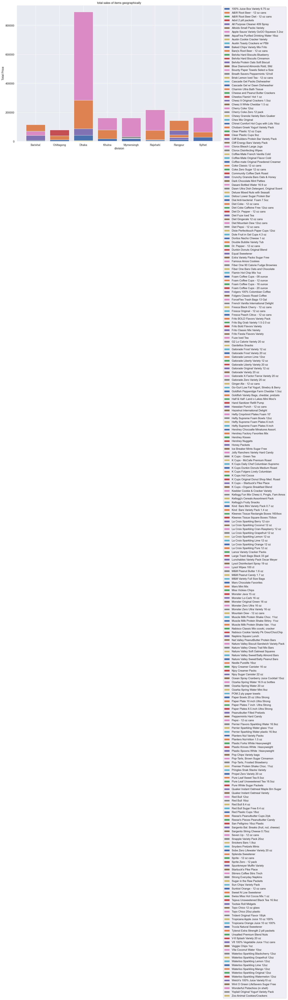

In [56]:
plt.figure(figsize = (15,10))
for item_name, data in df_9.groupby('item_name'):
    plt.bar(data['division'], data['total_price'], label=item_name)

plt.xlabel('division')
plt.ylabel('Total Price')
plt.title('total sales of items geographically')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

## Q10: What are the average sales of products sales per store monthly?

    S1->M1-> avg_sales

    s1-> M2 -> avg_sales

In [57]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ SELECT s.store_key, t.month, avg(f.total_price) FROM ecomdb_star_schema.fact_table f 
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            join ecomdb_star_schema.store_dim s on s.store_key = f.store_key
            group by cube(s.store_key, t.month)
            order by s.store_key, t.month;
        """
cur.execute(div_q)
records = cur.fetchall()
df_10 = pd.DataFrame(records, columns = ["store_key","month","avg_total_price"])
df_10 = df_10.dropna()
df_10["avg_total_price"] = df_10["avg_total_price"].astype("float64")
df_10

Connection to DB established!


,store_key,month,avg_total_price
0,S0001,1.0,1267.000000
1,S0001,2.0,989.894737
2,S0001,3.0,1337.815217
3,S0001,4.0,707.687500
4,S0001,5.0,589.587500
...,...,...,...
566,S0044,8.0,483.000000
567,S0044,9.0,697.694444
568,S0044,10.0,784.850000
569,S0044,11.0,309.264706


C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

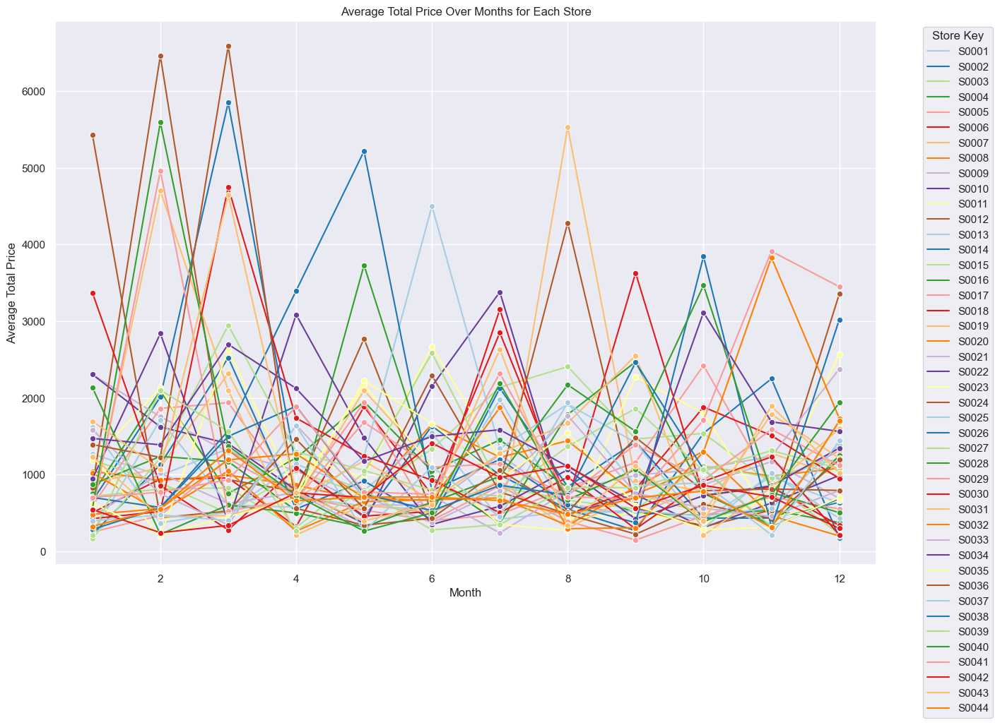

In [58]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.lineplot(x='month', y='avg_total_price', hue='store_key', data=df_10, marker='o', palette='Paired', ax=ax)

plt.title("Average Total Price Over Months for Each Store")
plt.xlabel("Month")
plt.ylabel("Average Total Price")
plt.legend(title='Store Key', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

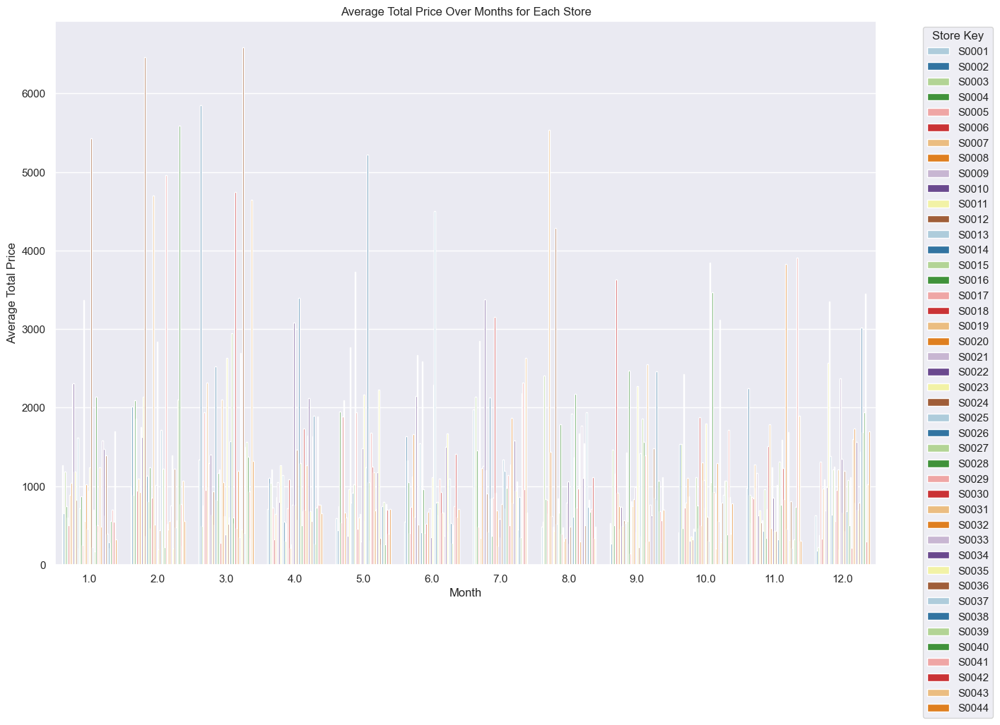

In [59]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.barplot(x='month', y='avg_total_price', hue='store_key', data=df_10, palette='Paired', ax=ax)

plt.title("Average Total Price Over Months for Each Store")
plt.xlabel("Month")
plt.ylabel("Average Total Price")
plt.legend(title='Store Key', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

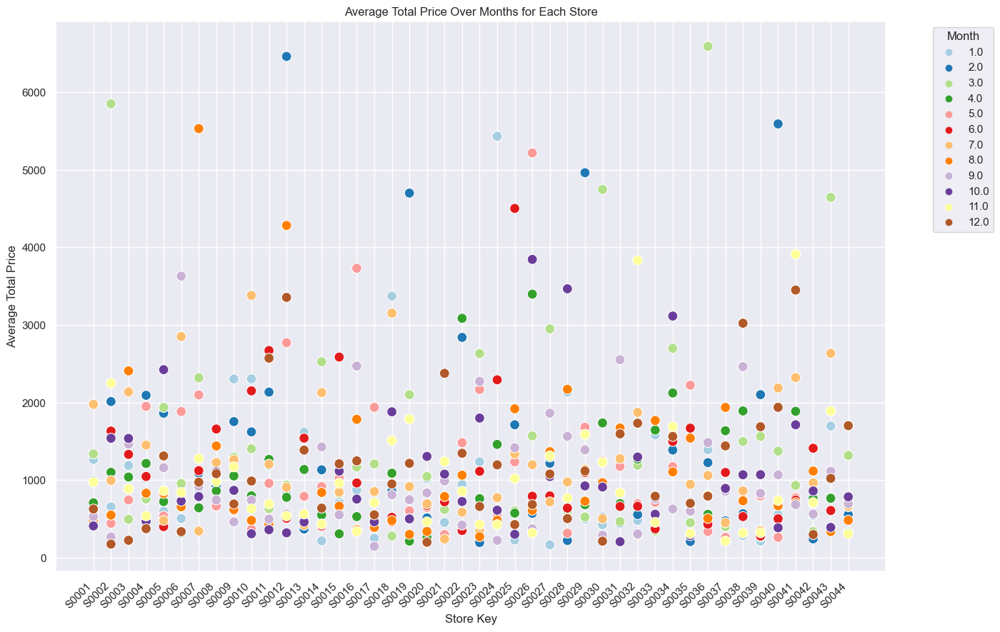

In [60]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.scatterplot(x='store_key', y='avg_total_price', hue='month', data=df_10, palette='Paired', s=100, ax=ax)

plt.title("Average Total Price Over Months for Each Store")
plt.xlabel("Store Key")
plt.ylabel("Average Total Price")
plt.xticks(rotation=45, ha='right')
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Analytics

## 1. store and time dimensional financial analytics.

In [4]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.year, s.division, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.store_dim s on f.store_key = s.store_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            group by cube(t.year, s.division)
            order by t.year, s.division;
        """

cur.execute(div_q)
records = cur.fetchall()
A_1 = pd.DataFrame(records, columns=["year","division","total_sales"] )
A_1 = A_1.dropna()
A_1["total_sales"] = A_1["total_sales"].astype("float64")
A_1

Connection to DB established!


,year,division,total_sales
0,2014.0,Barishal,62827.50
1,2014.0,Chittagong,99715.50
2,2014.0,Dhaka,399714.50
3,2014.0,Khulna,92302.50
4,2014.0,Mymensingh,34710.50
...,...,...,...
75,2022.0,Khulna,96448.75
76,2022.0,Mymensingh,54857.00
77,2022.0,Rajshahi,91657.25
78,2022.0,Rangpur,142034.00


In [5]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.year, s.store_size, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.store_dim s on f.store_key = s.store_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            where t.year = 2014
            group by cube(t.year, s.store_size)
            order by s.store_size;
        """

cur.execute(div_q)
records = cur.fetchall()
A_1_1 = pd.DataFrame(records, columns=["year","store_size","total_sales"] )
A_1_1 = A_1_1.dropna()
A_1_1["total_sales"] = A_1_1["total_sales"].astype("float64")
A_1_1

Connection to DB established!


,year,store_size,total_sales
1,2014.0,high,190619.00
2,2014.0,medium,429909.25
5,2014.0,small,339855.00


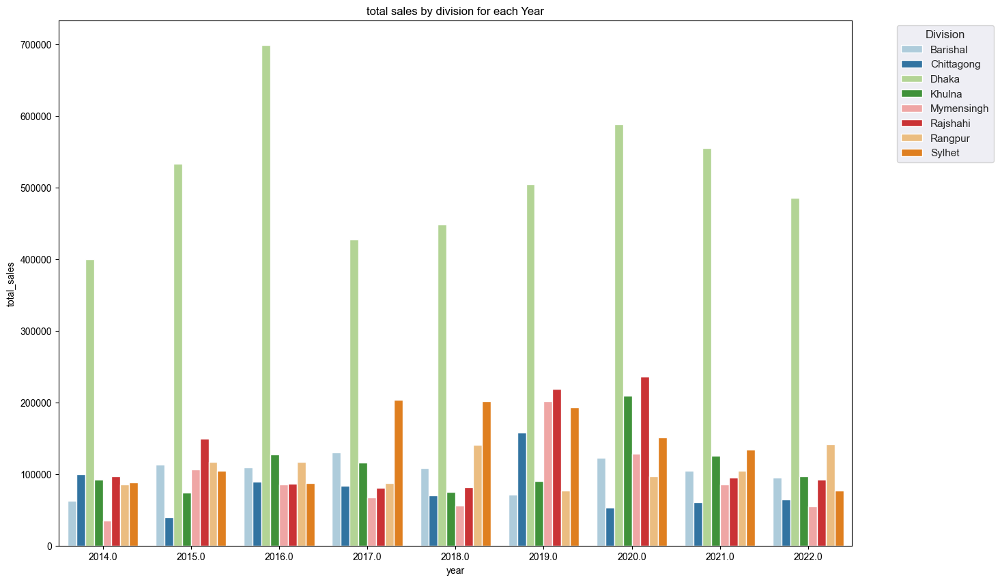

In [6]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.barplot(x='year', y='total_sales', hue='division', data=A_1, palette='Paired', ax=ax)

plt.title("total sales by division for each Year")
plt.xlabel("year")
plt.ylabel("total_sales")
plt.legend(title='Division', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Shad Abdullah\AppData\Local\Temp\ipykernel_10636\2299159870.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='store_size', y='total_sales', data=A_1_1, palette='Paired', ax=ax)


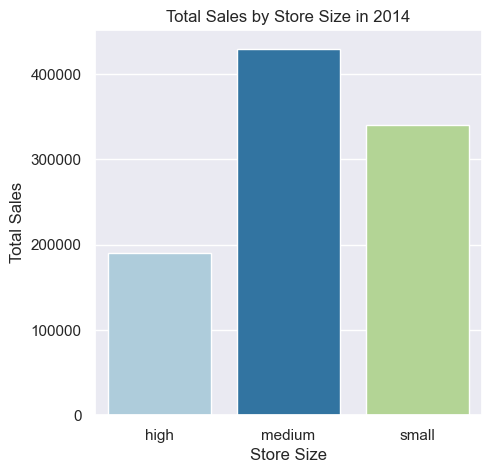

In [7]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.barplot(x='store_size', y='total_sales', data=A_1_1, palette='Paired', ax=ax)

plt.title("Total Sales by Store Size in 2014")
plt.xlabel("Store Size")
plt.ylabel("Total Sales")
plt.show()

## 2. customer and time dimensional financial analytics.

In [65]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.year, c.division, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.customer_dim c on c.coustomer_key = f.coustomer_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            where t.year = 2014
            group by rollup(t.year, c.division)
            order by sum(f.total_price) desc;
        """

cur.execute(div_q)
records = cur.fetchall()
A_2 = pd.DataFrame(records, columns=["year","customer_division","total_sales"] )
A_2 = A_2.dropna()
A_2["total_sales"] = A_2["total_sales"].astype("float64")
A_2

Connection to DB established!


,year,customer_division,total_sales
2,2014.0,Dhaka,650813.75
3,2014.0,Chittagong,219465.00
4,2014.0,Sylhet,58053.50
5,2014.0,Barishal,32051.00


In [66]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.year, c.division, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.customer_dim c on c.coustomer_key = f.coustomer_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            group by cube(t.year, c.division)
            order by t.year, c.division, sum(f.total_price);
        """

cur.execute(div_q)
records = cur.fetchall()
A_2_1 = pd.DataFrame(records, columns=["year","customer_division","total_sales"] )
A_2_1 = A_2_1.dropna()
A_2_1["total_sales"] = A_2_1["total_sales"].astype("float64")
A_2_1

Connection to DB established!


,year,customer_division,total_sales
0,2014.0,Barishal,32051.00
1,2014.0,Chittagong,219465.00
2,2014.0,Dhaka,650813.75
3,2014.0,Sylhet,58053.50
5,2015.0,Barishal,73342.75
6,2015.0,Chittagong,194361.50
7,2015.0,Dhaka,864945.25
8,2015.0,Sylhet,103111.00
10,2016.0,Barishal,18916.50
11,2016.0,Chittagong,152138.75


C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


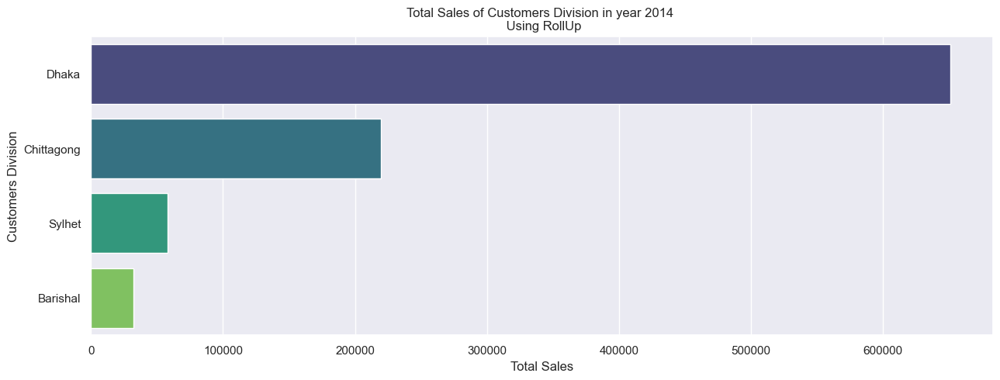

In [67]:
fig, ax = plt.subplots(figsize=(15, 5))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.barplot(x='total_sales', y='customer_division', data=A_2, palette='viridis', ax=ax)

plt.title("Total Sales of Customers Division in year 2014 \n Using RollUp")
plt.xlabel("Total Sales")
plt.ylabel("Customers Division")
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

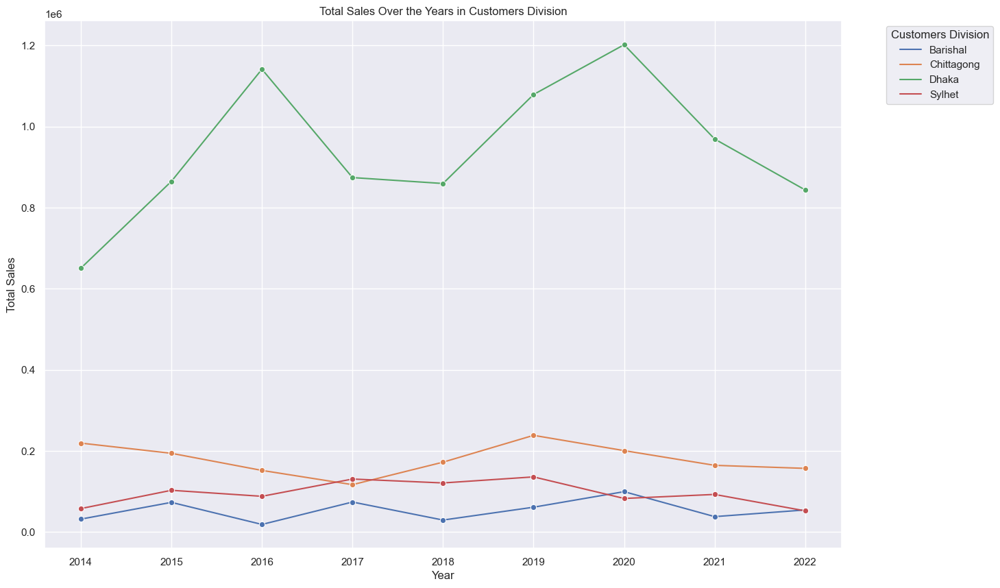

In [68]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.lineplot(x='year', y='total_sales', hue='customer_division', data=A_2_1, marker='o', ax=ax)

plt.title("Total Sales Over the Years in Customers Division")
plt.xlabel("Year")
plt.ylabel("Total Sales")
plt.legend(title='Customers Division', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

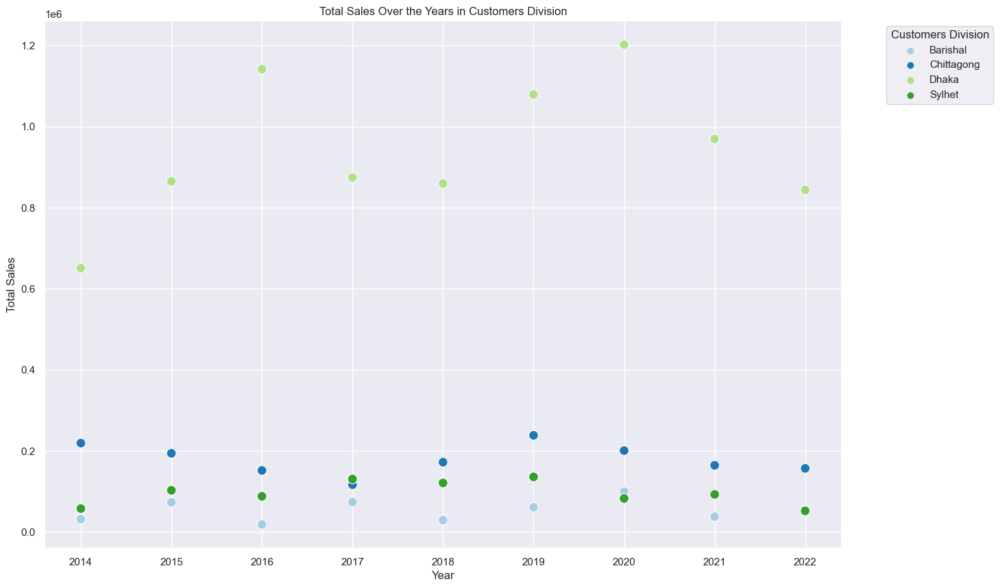

In [69]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.scatterplot(x='year', y='total_sales', hue='customer_division', data=A_2_1, palette='Paired', s=100, ax=ax)

plt.title("Total Sales Over the Years in Customers Division")
plt.xlabel("Year")
plt.ylabel("Total Sales")
plt.legend(title='Customers Division', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## 3. item and time dimensional financial analytics.


In [70]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.year, i.item_name, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.item_dim i on i.item_key = f.item_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            group by cube(t.year, i.item_name)
            order by t.year, i.item_name;
        """

cur.execute(div_q)
records = cur.fetchall()
A_3 = pd.DataFrame(records, columns=["year","item_name","total_sales"] )
A_3 = A_3.dropna()
A_3["total_sales"] = A_3["total_sales"].astype("float64")
A_3

Connection to DB established!


,year,item_name,total_sales
0,2014.0,100% Juice Box Variety 6.75 oz,840.0
1,2014.0,A&W Root Beer - 12 oz cans,782.0
2,2014.0,A&W Root Beer Diet - 12 oz cans,324.0
3,2014.0,Advil 2 pill packets,994.0
4,2014.0,All Purpose Cleaner 409 Spray,9036.0
...,...,...,...
2291,2022.0,Welch's 100% Juice Variety10 oz,102.0
2292,2022.0,Wint O Green LifeSavers Sugar Free,1808.0
2293,2022.0,Wonderful Pistachios (in shell),396.0
2294,2022.0,Yoplait Original Yogurt Variety Pack,336.0


In [71]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.quarter, i.item_name, sum(f.total_price) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.item_dim i on i.item_key = f.item_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            where year = 2015
            group by cube(t.quarter, i.item_name)
            order by t.quarter, i.item_name;
        """

cur.execute(div_q)
records = cur.fetchall()
A_3_1 = pd.DataFrame(records, columns=["quarter","item_name","total_sales"] )
A_3_1 = A_3_1.dropna()
A_3_1["total_sales"] = A_3_1["total_sales"].astype("float64")
A_3_1

Connection to DB established!


,quarter,item_name,total_sales
0,Q1,A&W Root Beer Diet - 12 oz cans,94.5
1,Q1,Advil 2 pill packets,644.0
2,Q1,All Purpose Cleaner 409 Spray,1764.0
3,Q1,Altoids Small Packs Variety,12.0
4,Q1,Apple Sauce Variety GoGO Squeeze 3.2oz,252.0
...,...,...,...
664,Q4,Waterloo Sparkling Watermelon 12oz,56.0
665,Q4,Welch's 100% Juice Variety10 oz,51.0
666,Q4,Wint O Green LifeSavers Sugar Free,80.0
667,Q4,Yoplait Original Yogurt Variety Pack,312.0


C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

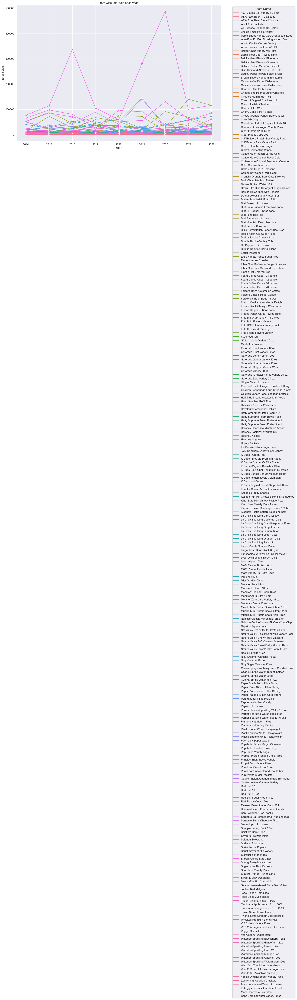

In [72]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.lineplot(x='year', y='total_sales', hue='item_name', data=A_3, marker='o', ax=ax)

plt.title("item wise total sale each year")
plt.xlabel("Year")
plt.ylabel("Total Sales")
plt.legend(title='Item Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

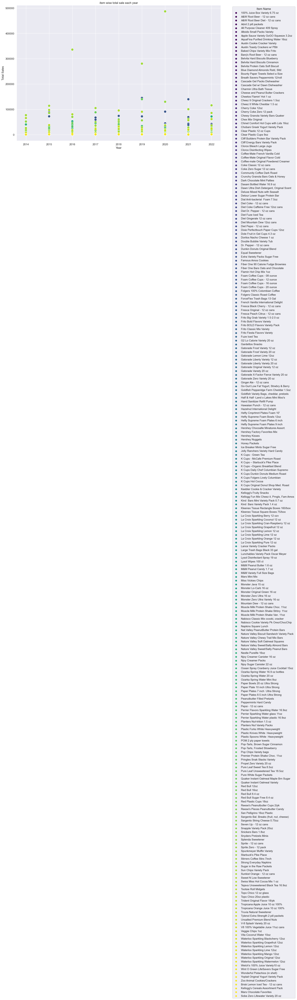

In [73]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.scatterplot(x='year', y='total_sales', hue='item_name', data=A_3, palette='viridis', s=100, ax=ax)

plt.title("item wise total sale each year")
plt.xlabel("Year")
plt.ylabel("Total Sales")
plt.legend(title='Item Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

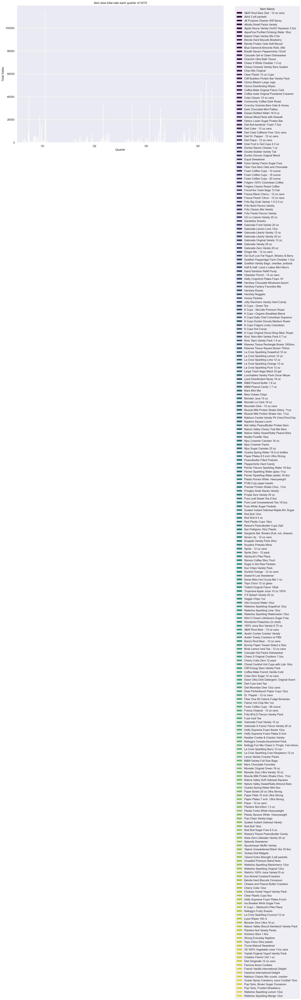

In [74]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.barplot(x='quarter', y='total_sales', hue='item_name', data=A_3_1, palette='viridis', ax=ax)

plt.title("item wise total sale each quarter of 2015")
plt.xlabel("Quarter")
plt.ylabel("Total Sales")
plt.legend(title='Item Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## 4. store and time dimensional inventory analytics.

In [75]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.year, s.store_size, sum(f.quantity) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.store_dim s on s.store_key = f.store_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            group by cube(t.year, s.store_size)
            order by t.year, s.store_size desc;
        """

cur.execute(div_q)
records = cur.fetchall()
A_4 = pd.DataFrame(records, columns=["year","store_size","quantity"] )
A_4 = A_4.dropna()
A_4["quantity"] = A_4["quantity"].astype("float64")
A_4

Connection to DB established!


,year,store_size,quantity
1,2014.0,small,19315.0
2,2014.0,medium,23698.0
3,2014.0,high,10647.0
5,2015.0,small,27416.0
6,2015.0,medium,18006.0
7,2015.0,high,22046.0
9,2016.0,small,26839.0
10,2016.0,medium,28659.0
11,2016.0,high,23604.0
13,2017.0,small,22473.0


In [76]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select s.division, t.year, f.unit, count(f.unit) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.store_dim s on s.store_key = f.store_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            where t.year = 2016
            group by cube(s.division, t.year, f.unit)
            order by s.division, f.unit;
        """

cur.execute(div_q)
records = cur.fetchall()
A_4_1 = pd.DataFrame(records, columns=["division","year","unit","unit_count"] )
A_4_1 = A_4_1.dropna()
A_4_1

Connection to DB established!


,division,year,unit,unit_count
1,Barishal,2016.0,bags,4
3,Barishal,2016.0,bars,2
4,Barishal,2016.0,bottles,17
7,Barishal,2016.0,cans,21
9,Barishal,2016.0,cartons,1
...,...,...,...,...
193,Sylhet,2016.0,oz,10
194,Sylhet,2016.0,pack,4
196,Sylhet,2016.0,pk,3
198,Sylhet,2016.0,rolls,1


C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

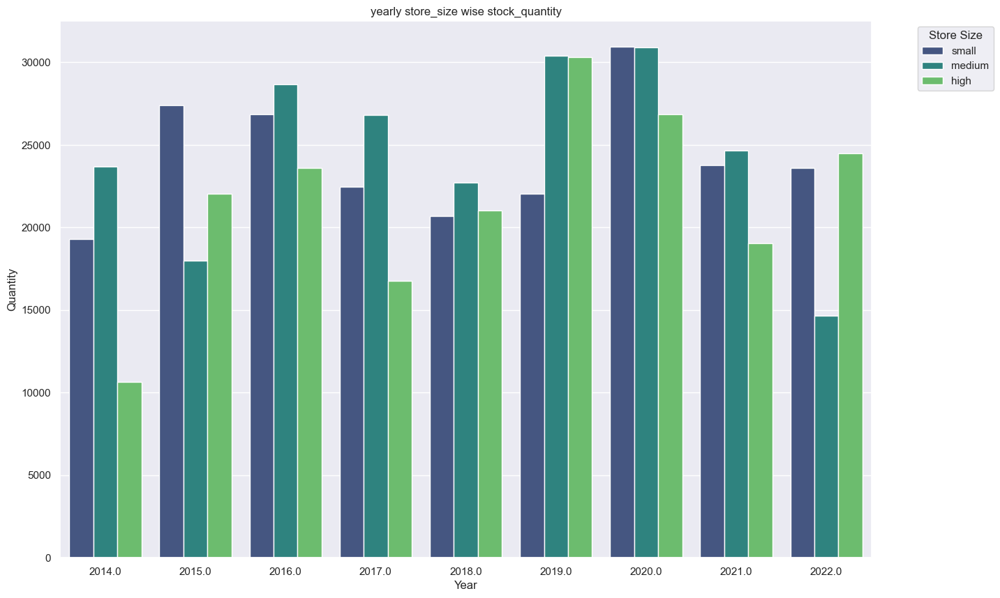

In [77]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.barplot(x='year', y='quantity', hue='store_size', data=A_4, palette='viridis', ax=ax)

plt.title("yearly store_size wise stock_quantity")
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.legend(title='Store Size', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

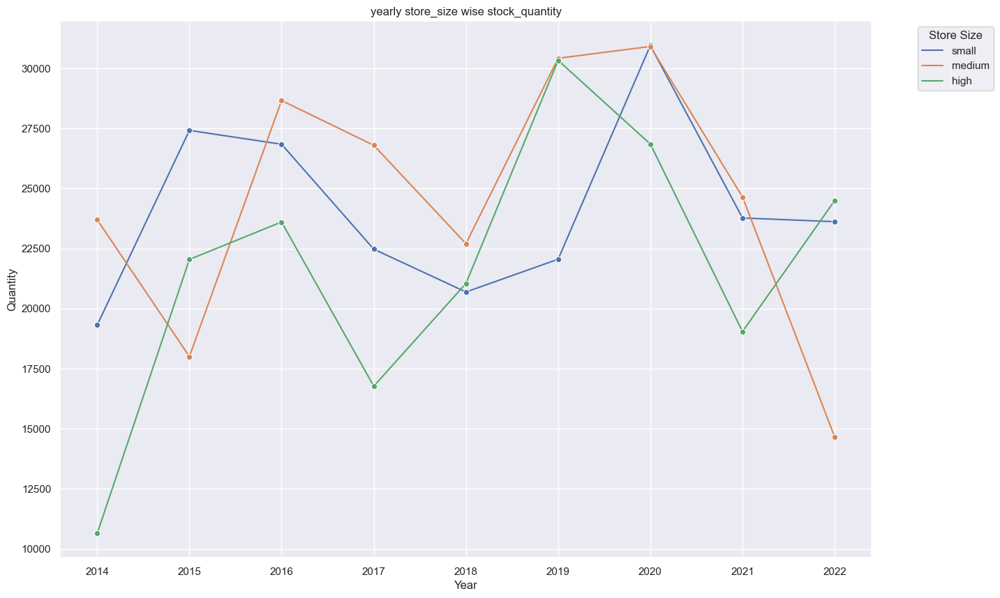

In [78]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.lineplot(x='year', y='quantity', hue='store_size', data=A_4, marker='o', ax=ax)

plt.title("yearly store_size wise stock_quantity")
plt.xlabel("Year")
plt.ylabel("Quantity")
plt.legend(title='Store Size', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

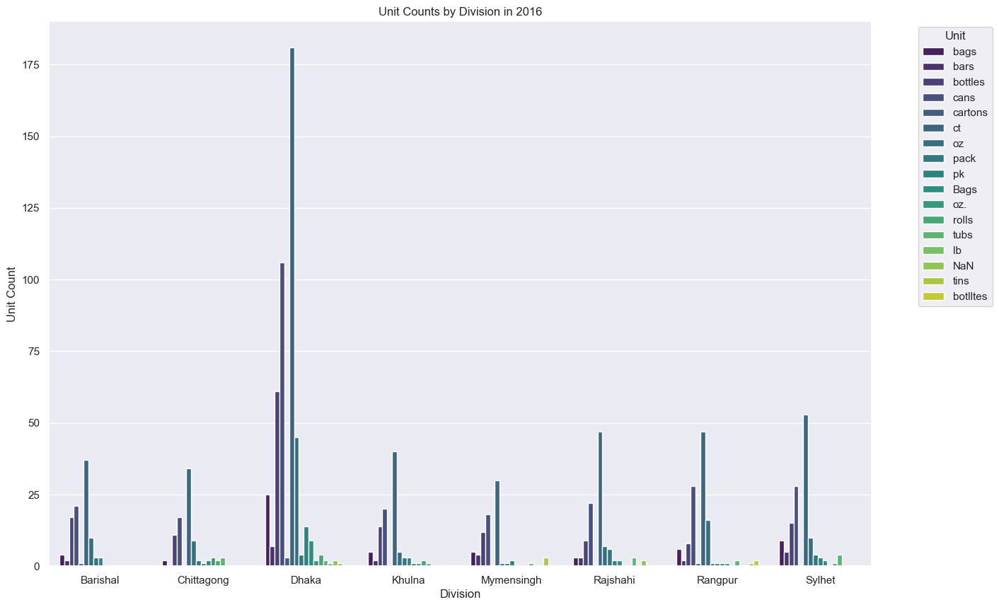

In [79]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.barplot(x='division', y='unit_count', hue='unit', data=A_4_1, palette='viridis', ax=ax)

plt.title("Unit Counts by Division in 2016")
plt.xlabel("Division")
plt.ylabel("Unit Count")
plt.legend(title='Unit', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

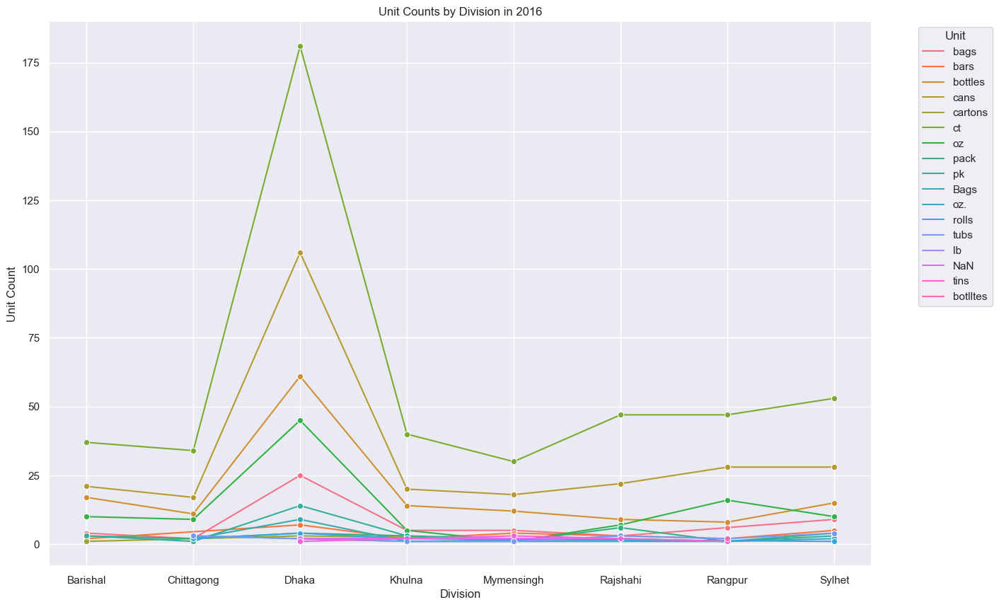

In [80]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")
sns.lineplot(x='division', y='unit_count', hue='unit', data=A_4_1, marker='o', ax=ax)

plt.title("Unit Counts by Division in 2016")
plt.xlabel("Division")
plt.ylabel("Unit Count")
plt.legend(title='Unit', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## 5. item and time dimensional inventory analytics.

In [81]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.year, t.quarter, sum(i.stock_quantity) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.item_dim i on i.item_key = f.item_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            group by cube(t.year, t.quarter)
            order by t.year, t.quarter;
        """

cur.execute(div_q)
records = cur.fetchall()
A_5 = pd.DataFrame(records, columns=["year","quarter","stock_quantity"] )
A_5 = A_5.dropna()
A_5["stock_quantity"] = A_5["stock_quantity"].astype("int")
A_5

Connection to DB established!


,year,quarter,stock_quantity
0,2014.0,Q1,21824
1,2014.0,Q2,26939
2,2014.0,Q3,30632
3,2014.0,Q4,24676
5,2015.0,Q1,38163
6,2015.0,Q2,21988
7,2015.0,Q3,29742
8,2015.0,Q4,39289
10,2016.0,Q1,28329
11,2016.0,Q2,29450


In [82]:
con = PostgresConnection().getConnection()
cur = con.cursor()

div_q = """ select t.year, sum(f.quantity), sum(i.stock_quantity) from ecomdb_star_schema.fact_table f
            join ecomdb_star_schema.item_dim i on i.item_key = f.item_key
            join ecomdb_star_schema.time_dim t on t.time_key = f.time_key
            group by cube(t.year)
            order by t.year;
        """

cur.execute(div_q)
records = cur.fetchall()
A_5_1 = pd.DataFrame(records, columns=["year","quantity","stock_quantity"] )
A_5_1 = A_5_1.dropna()
A_5_1["quantity"] = A_5_1["quantity"].astype("int")
A_5_1["stock_quantity"] = A_5_1["stock_quantity"].astype("int")
A_5_1

Connection to DB established!


,year,quantity,stock_quantity
0,2014.0,53660,104071
1,2015.0,67468,129182
2,2016.0,79102,145494
3,2017.0,66040,136796
4,2018.0,64439,138203
5,2019.0,82801,148895
6,2020.0,88703,168465
7,2021.0,67461,139907
8,2022.0,62770,128140


C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

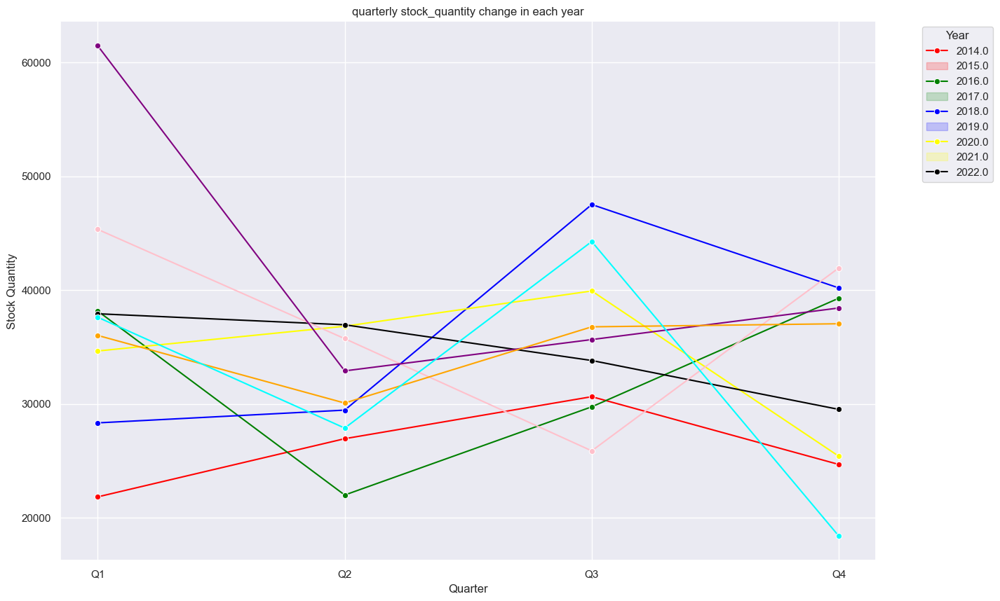

In [83]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")

custom_palette = ['red', 'green', 'blue', 'yellow', 'black', 'pink', 'purple', 'orange', 'cyan']
sns.lineplot(x='quarter', y='stock_quantity', hue='year', data=A_5, marker='o', palette=custom_palette, ax=ax)

plt.title("quarterly stock_quantity change in each year")
plt.xlabel("Quarter")
plt.ylabel("Stock Quantity")

legend_labels = [str(year) for year in A_5['year'].unique()]
ax.legend(title='Year', labels=legend_labels, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Saad\OneDrive - northsouth.edu\Internship\shadVenv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categ

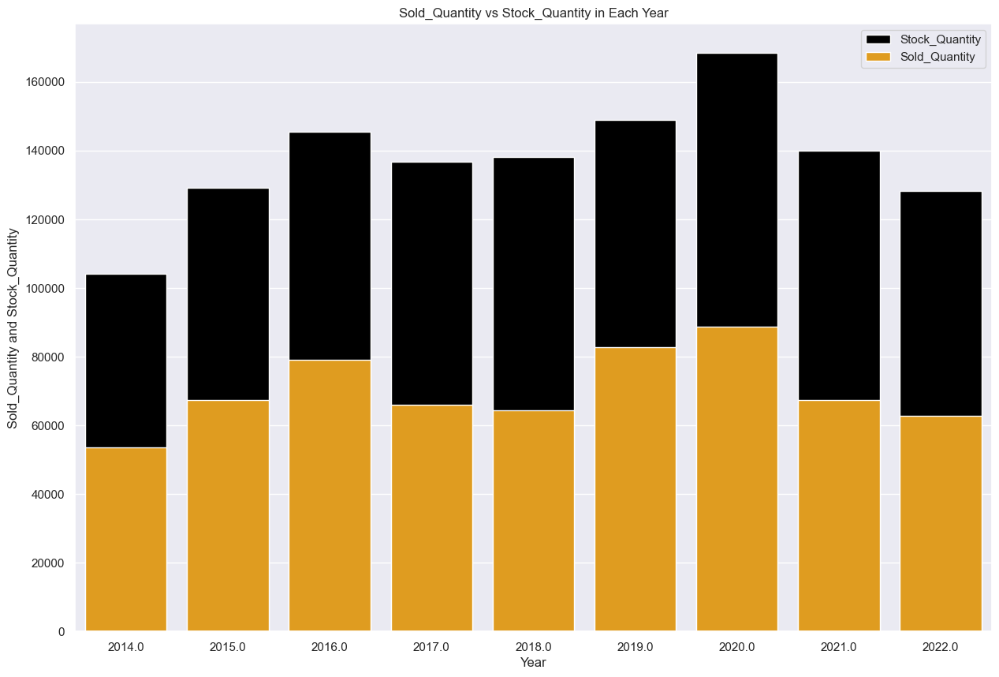

In [84]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.set_context("notebook")

sns.barplot(x='year', y='stock_quantity', data=A_5_1, color='black', label='Stock_Quantity')
sns.barplot(x='year', y='quantity', data=A_5_1, color='orange', label='Sold_Quantity')

plt.title("Sold_Quantity vs Stock_Quantity in Each Year")
plt.xlabel("Year")
plt.ylabel("Sold_Quantity and Stock_Quantity")
plt.legend()
plt.show()